In [2]:
import pandas as pd
import numpy as np

from pathlib import Path

from tqdm.auto import tqdm

tqdm.pandas()

In [3]:
csv_path = "/kaggle/input/datasets/robinchetry/balanced/balanced_subset.csv"

df = pd.read_csv(csv_path)

print(df.shape)
df.head()

(24344, 7)


,image_id,panel_suffix,visualization_category,visualization_subtype,image_path,caption,summary
0,ceramics_prod_img37464,B,Mechanical Test,Stress-Strain Curve,/mnt/home2/home/subham_g1/subham_CMEG/material...,Shear stress-strain curves for 3D-printed Ti6A...,Shear stress-strain curves are presented for 3...
1,ceramics_prod_img67212,A,Spectroscopy,EELS Spectrum,/mnt/home2/home/subham_g1/subham_CMEG/material...,Carbon and nitrogen K-edge EELS spectra of ABS...,The carbon and nitrogen K-edge EELS spectra fo...
2,ceramics_prod_img42745,B,Generic Plot,Histogram,/mnt/home2/home/subham_g1/subham_CMEG/material...,Frequency distribution histogram of GND values...,This histogram quantifies the GND value distri...
3,ceramics_prod_img33667,C,Electrochemistry,Nyquist Plot,/mnt/home2/home/subham_g1/subham_CMEG/material...,Nyquist plots derived from electrochemical imp...,Electrochemical impedance spectroscopy (EIS) t...
4,ni_alloy_img4271,B,Phase/Equilibrium Diagram,CALPHAD Diagram,/mnt/home2/home/subham_g1/subham_CMEG/material...,Critical temperature landscape for the α-phase...,Representing the α-phase critical temperatures...


In [4]:
df["image_key"] = (
    df["image_id"].astype(str)
    + "_"
    + df["panel_suffix"].astype(str)
)

df[[
    "image_id",
    "panel_suffix",
    "image_key"
]].head()

,image_id,panel_suffix,image_key
0,ceramics_prod_img37464,B,ceramics_prod_img37464_B
1,ceramics_prod_img67212,A,ceramics_prod_img67212_A
2,ceramics_prod_img42745,B,ceramics_prod_img42745_B
3,ceramics_prod_img33667,C,ceramics_prod_img33667_C
4,ni_alloy_img4271,B,ni_alloy_img4271_B


In [5]:
image_dir = Path(
    "/kaggle/input/datasets/robinchetry/labelled-images/balanced_images"
)

df["full_path"] = (
    image_dir
    / (df["image_key"] + ".jpg")
)

In [6]:
exist_rate = df["full_path"].progress_apply(
    lambda x: x.exists()
)

print(
    "Existence rate:",
    exist_rate.mean()
)

  0%|          | 0/24344 [00:00<?, ?it/s]

Existence rate: 1.0


In [7]:
target_col = "visualization_subtype"

print(
    "Unique subtypes:",
    df[target_col].nunique()
)

df[target_col].value_counts().head(20)

Unique subtypes: 138


visualization_subtype
Stress-Strain Curve        250
Histogram                  250
DFT Result                 250
Nyquist Plot               250
CALPHAD Diagram            250
Load-Displacement Curve    250
Creep Curve                250
MD Snapshot                250
Box Plot                   250
Feature Importance Plot    250
EDS Map                    250
Ternary Phase Diagram      250
Fluorescence Microscopy    250
Phase-Field Simulation     250
Fracture Toughness Plot    250
Bar Chart                  250
UV-Vis Spectrum            250
Cyclic Voltammogram        250
Pole Figure                250
DSC Curve                  250
Name: count, dtype: int64

In [7]:
!pip install -q transformers

In [8]:
import torch

from transformers import (
    AutoProcessor,
    SiglipVisionModel
)

device = (
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

processor = AutoProcessor.from_pretrained(
    "google/siglip-base-patch16-224"
)

model = SiglipVisionModel.from_pretrained(
    "google/siglip-base-patch16-224"
)

model = model.to(device)
model.eval()

print(device)

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

The image processor of type `SiglipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/208 [00:00<?, ?it/s]

SiglipVisionModel LOAD REPORT from: google/siglip-base-patch16-224
Key                                                          | Status     |  | 
-------------------------------------------------------------+------------+--+-
text_model.encoder.layers.{0...11}.layer_norm1.bias          | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.layer_norm2.weight        | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.layer_norm2.bias          | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.mlp.fc1.weight            | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.q_proj.bias     | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
text_model.head.weight                                       | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.v_proj.bias     | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.self_attn.k_proj.bias     | UNEXPECTED |  | 
text_model.encoder.layers.{0...11}.mlp.fc2.bias      

cuda


In [9]:
from PIL import Image

img = Image.open(
    df["full_path"].iloc[0]
).convert("RGB")

inputs = processor(
    images=img,
    return_tensors="pt"
)

inputs = {
    k:v.to(device)
    for k,v in inputs.items()
}

with torch.no_grad():

    output = model(
        pixel_values=inputs["pixel_values"]
    )

print(
    output.pooler_output.shape
)

torch.Size([1, 768])


In [10]:
from torch.utils.data import Dataset

from PIL import Image

class FigureDataset(Dataset):

    def __init__(self, paths):
        self.paths = paths

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):

        image = Image.open(
            self.paths[idx]
        ).convert("RGB")

        return image

In [11]:
from torch.utils.data import DataLoader

dataset = FigureDataset(
    df["full_path"].tolist()
)

loader = DataLoader(
    dataset,
    batch_size=64,
    shuffle=False,
    num_workers=4,
    collate_fn=lambda x: x
)

print(len(dataset))

24344


In [12]:
import numpy as np

embeddings = []

for images in tqdm(
    loader,
    desc="Extracting SigLIP Embeddings"
):

    inputs = processor(
        images=images,
        return_tensors="pt"
    )

    pixel_values = (
        inputs["pixel_values"]
        .to(device)
    )

    with torch.no_grad():

        features = model(
            pixel_values=pixel_values
        ).pooler_output

    embeddings.append(
        features.cpu().numpy()
    )

embeddings = np.concatenate(
    embeddings,
    axis=0
)

print(embeddings.shape)

Extracting SigLIP Embeddings:   0%|          | 0/381 [00:00<?, ?it/s]

(24344, 768)


In [13]:
np.save(
    "siglip_embeddings.npy",
    embeddings
)

print("saved")

saved


In [14]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

y = le.fit_transform(
    df["visualization_subtype"]
)

print(
    "Classes:",
    len(le.classes_)
)

Classes: 138


In [15]:
print(
    embeddings.shape
)

print(
    len(y)
)

print(
    len(df)
)

(24344, 768)
24344
24344


In [16]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    n_clusters=138,
    random_state=42,
    n_init=20
)

cluster_labels = kmeans.fit_predict(
    embeddings
)

In [17]:
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score
)

ari = adjusted_rand_score(
    y,
    cluster_labels
)

nmi = normalized_mutual_info_score(
    y,
    cluster_labels
)

print("ARI =", ari)
print("NMI =", nmi)

ARI = 0.17976980010248894
NMI = 0.4955244187557853


In [18]:
subtype_counts = (
    df["visualization_subtype"]
    .value_counts()
)

print(
    subtype_counts.describe()
)

subtype_counts.head(20)

count    138.000000
mean     176.405797
std      101.225818
min        1.000000
25%       73.000000
50%      250.000000
75%      250.000000
max      250.000000
Name: count, dtype: float64


visualization_subtype
Stress-Strain Curve        250
Histogram                  250
DFT Result                 250
Nyquist Plot               250
CALPHAD Diagram            250
Load-Displacement Curve    250
Creep Curve                250
MD Snapshot                250
Box Plot                   250
Feature Importance Plot    250
EDS Map                    250
Ternary Phase Diagram      250
Fluorescence Microscopy    250
Phase-Field Simulation     250
Fracture Toughness Plot    250
Bar Chart                  250
UV-Vis Spectrum            250
Cyclic Voltammogram        250
Pole Figure                250
DSC Curve                  250
Name: count, dtype: int64

In [21]:
print(
    "Subtypes with <20 samples:",
    (subtype_counts < 20).sum()
)

print(
    "Subtypes with <50 samples:",
    (subtype_counts < 50).sum()
)

Subtypes with <20 samples: 22
Subtypes with <50 samples: 32


In [22]:
from collections import Counter

cluster_purity = []

for cluster_id in np.unique(cluster_labels):

    idx = cluster_labels == cluster_id

    labels = y[idx]

    counts = Counter(labels)

    dominant_count = counts.most_common(1)[0][1]

    purity = dominant_count / len(labels)

    cluster_purity.append(purity)

print("Mean purity:", np.mean(cluster_purity))
print("Median purity:", np.median(cluster_purity))
print("Max purity:", np.max(cluster_purity))

Mean purity: 0.41914087246282533
Median purity: 0.32857142857142857
Max purity: 1.0


In [8]:
purity_rows = []

for cluster_id in np.unique(cluster_labels):

    idx = cluster_labels == cluster_id

    labels = y[idx]

    counts = Counter(labels)

    dominant_label = counts.most_common(1)[0][0]
    dominant_count = counts.most_common(1)[0][1]

    purity = dominant_count / len(labels)

    purity_rows.append({
        "cluster": cluster_id,
        "size": len(labels),
        "purity": purity,
        "dominant_subtype": le.inverse_transform([dominant_label])[0]
    })

purity_df = pd.DataFrame(purity_rows)

purity_df.sort_values(
    "purity",
    ascending=False
).head(20)

NameError: name 'cluster_labels' is not defined

In [ ]:
label_cluster = pd.crosstab(
    df["visualization_subtype"],
    cluster_labels
)

rows = []

for subtype in label_cluster.index:

    counts = label_cluster.loc[subtype]

    total = counts.sum()

    largest_cluster = counts.idxmax()

    largest_count = counts.max()

    rows.append({
        "subtype": subtype,
        "total_images": total,
        "largest_cluster": largest_cluster,
        "largest_cluster_count": largest_count,
        "fraction": largest_count / total
    })

subtype_coherence = pd.DataFrame(rows)

subtype_coherence = subtype_coherence.sort_values(
    "fraction",
    ascending=True
)

subtype_coherence.head(20)

In [15]:
import matplotlib.pyplot as plt
from PIL import Image
import random

def show_subtype(subtype_name, n=40):

    subset = df[
        df["visualization_subtype"] == subtype_name
    ]

    sample_paths = (
        subset["full_path"]
        .sample(
            min(n, len(subset)),
            random_state=42
        )
        .tolist()
    )

    cols = 5
    rows = (len(sample_paths) + cols - 1) // cols

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(16, 4 * rows)
    )

    axes = axes.flatten()

    for ax, path in zip(axes, sample_paths):

        img = Image.open(path).convert("RGB")

        ax.imshow(img)
        ax.axis("off")

    for ax in axes[len(sample_paths):]:
        ax.axis("off")

    plt.suptitle(
        subtype_name,
        fontsize=18
    )

    plt.tight_layout()
    plt.show()

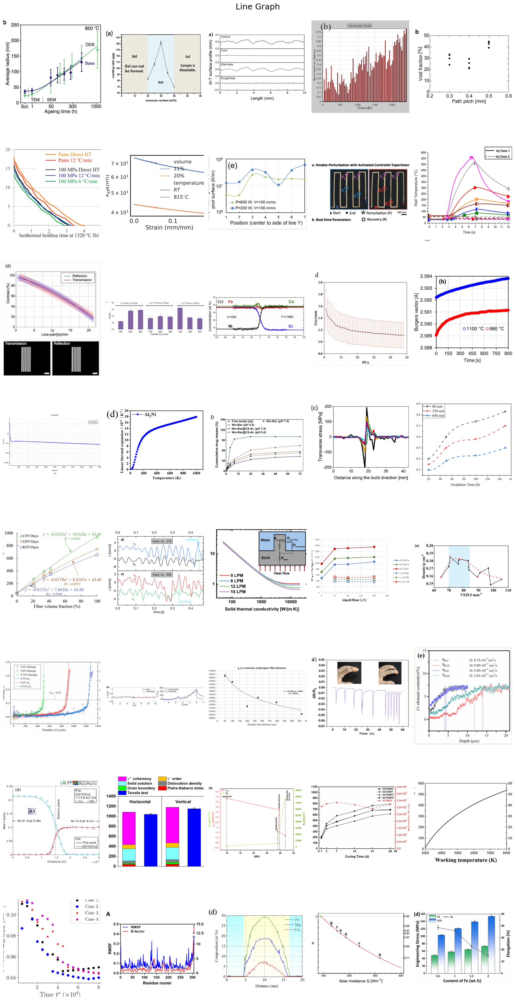

In [16]:
show_subtype("Line Graph")

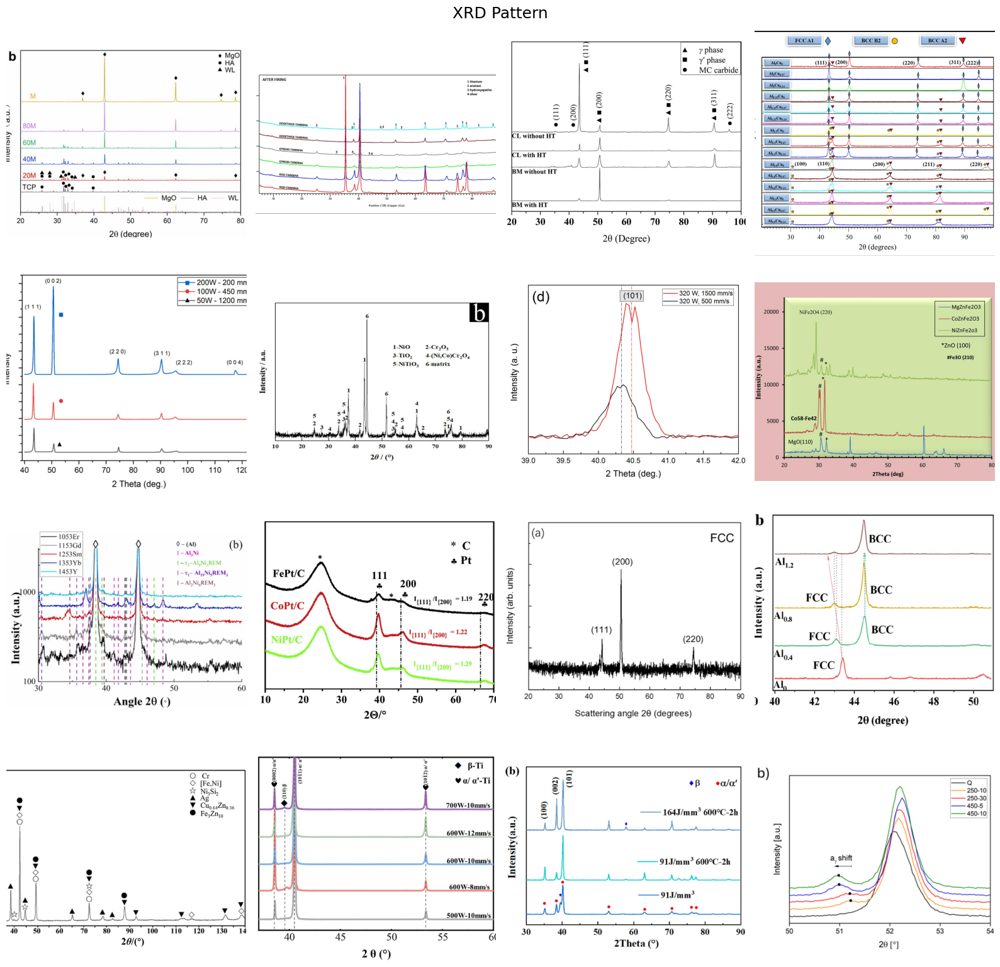

In [37]:
show_subtype("XRD Pattern")

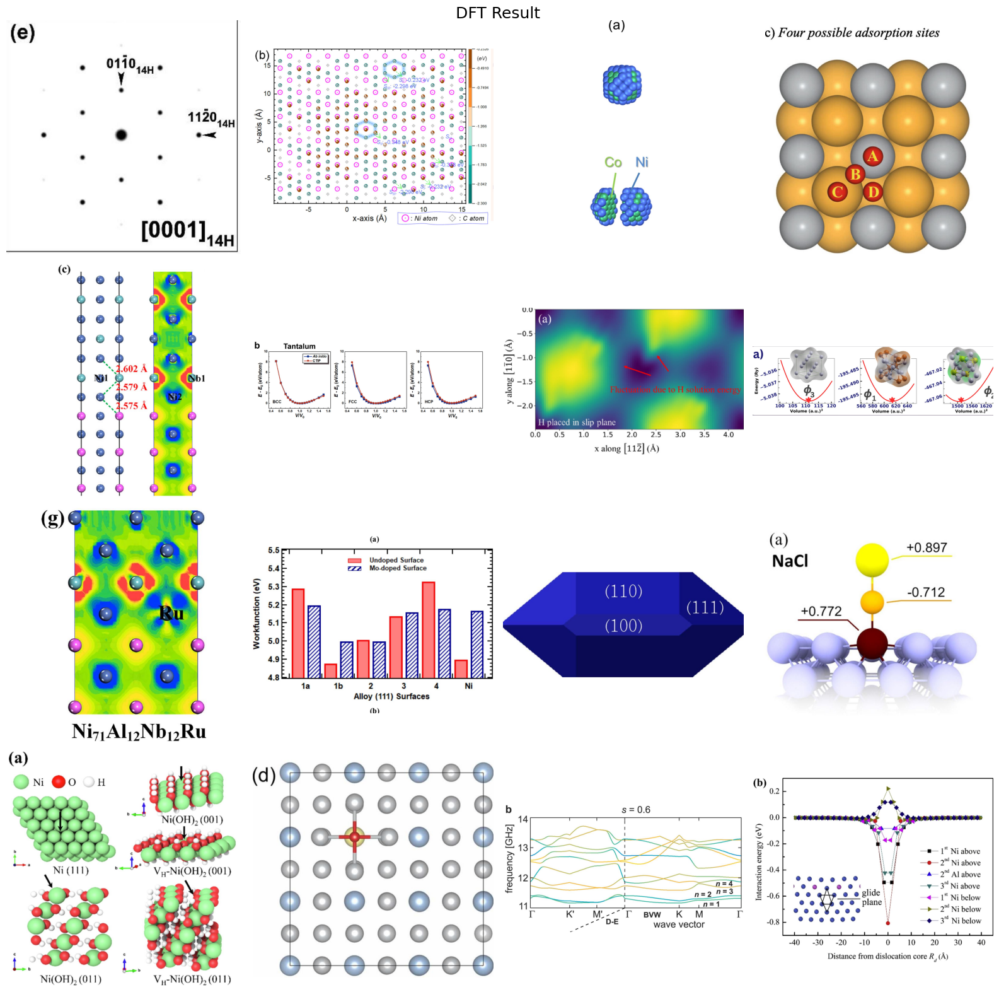

In [28]:
show_subtype("DFT Result")

In [29]:
cluster_sizes = (
    pd.Series(cluster_labels)
    .value_counts()
    .sort_values(ascending=False)
)

cluster_sizes.head(20)

13     375
72     341
98     340
17     335
37     335
126    335
108    329
121    329
36     322
73     311
39     298
130    296
114    290
119    289
1      287
87     270
118    266
54     265
81     263
45     260
Name: count, dtype: int64

In [30]:
print("Number of clusters:", len(cluster_sizes))
print("Largest cluster:", cluster_sizes.max())
print("Smallest cluster:", cluster_sizes.min())

Number of clusters: 138
Largest cluster: 375
Smallest cluster: 18


In [31]:
import matplotlib.pyplot as plt
from PIL import Image

def show_cluster(cluster_id, n=16):

    idx = np.where(cluster_labels == cluster_id)[0]

    sample_idx = np.random.choice(
        idx,
        size=min(n, len(idx)),
        replace=False
    )

    fig, axes = plt.subplots(
        4,
        4,
        figsize=(14,14)
    )

    axes = axes.flatten()

    for ax, i in zip(axes, sample_idx):

        img = Image.open(
            df.iloc[i]["full_path"]
        ).convert("RGB")

        ax.imshow(img)
        ax.axis("off")

    plt.suptitle(
        f"Cluster {cluster_id}",
        fontsize=18
    )

    plt.tight_layout()
    plt.show()

In [32]:
summary = []

for c in np.unique(cluster_labels):

    idx = cluster_labels == c

    labels = df.loc[
        idx,
        "visualization_subtype"
    ]

    top5 = labels.value_counts().head(5)

    summary.append({
        "cluster": c,
        "size": idx.sum(),
        "top_labels": list(top5.index),
        "counts": list(top5.values)
    })

summary_df = pd.DataFrame(summary)

summary_df.sort_values(
    "size",
    ascending=False
).head(20)

,cluster,size,top_labels,counts
13,13,375,"[Live/Dead Staining, Fluorescence Microscopy, ...","[153, 149, 38, 6, 5]"
72,72,341,"[Bar Chart, Generic Plot, Box Plot, Wear/Tribo...","[77, 25, 23, 21, 20]"
98,98,340,"[Fracture Toughness Plot, Parity Plot, Fatigue...","[38, 33, 31, 17, 17]"
37,37,335,"[Tafel Plot, Polarization Curve, Cyclic Voltam...","[89, 49, 31, 26, 16]"
17,17,335,"[Bar Chart, Generic Plot, Data Table, Fracture...","[54, 40, 32, 23, 20]"
126,126,335,"[Creep Curve, Nanoindentation Curve, Phase-Fie...","[71, 18, 15, 13, 13]"
108,108,329,"[Hardness Map, Nanoindentation Curve, Wear/Tri...","[65, 31, 23, 18, 15]"
121,121,329,"[M-H Hysteresis Loop, I-V Curve, M-T Curve, Na...","[74, 21, 21, 17, 16]"
36,36,322,"[TGA Curve, M-T Curve, DMA Curve, TMA Curve, D...","[108, 61, 22, 21, 18]"
73,73,311,"[EBSD Map, MD Snapshot, APT Reconstruction, DI...","[26, 25, 24, 23, 18]"


In [33]:
largest_clusters = (
    cluster_sizes.index[:20]
)

largest_clusters

Index([ 13,  72,  98,  17,  37, 126, 108, 121,  36,  73,  39, 130, 114, 119,
         1,  87, 118,  54,  81,  45],
      dtype='int32')

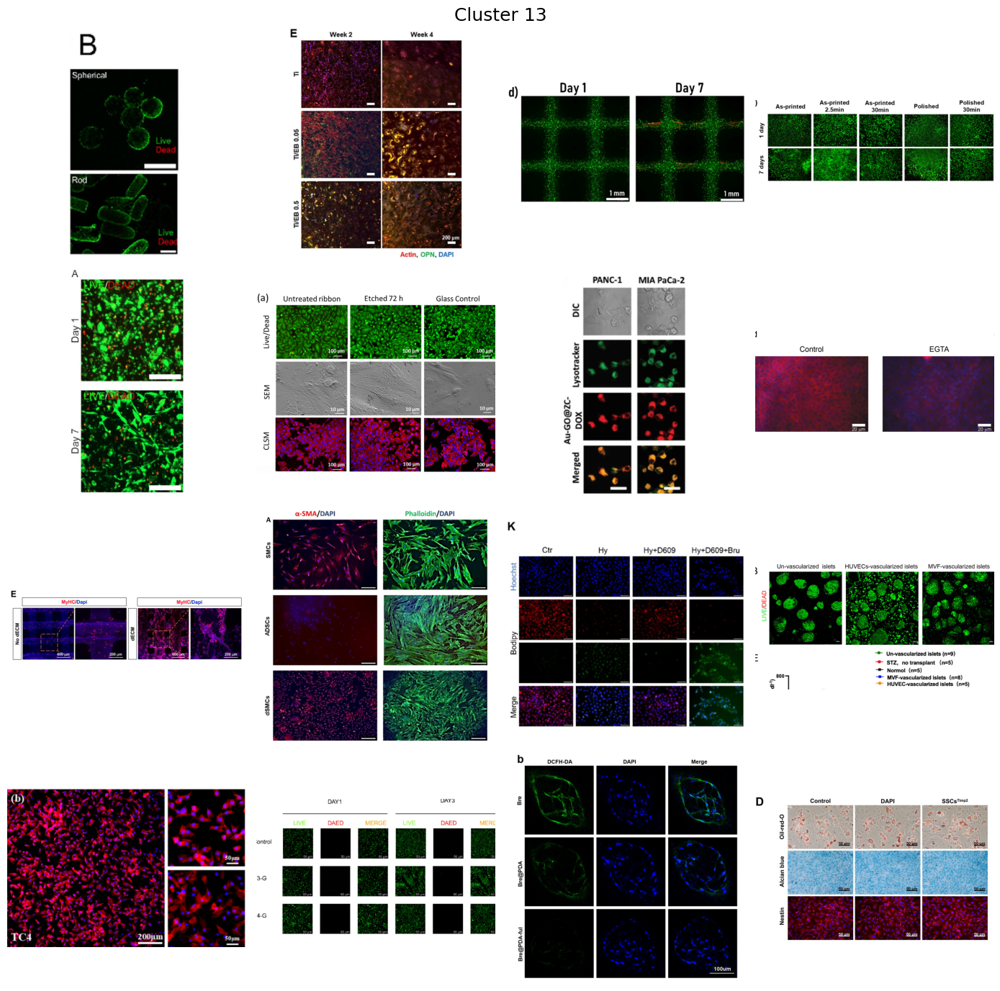

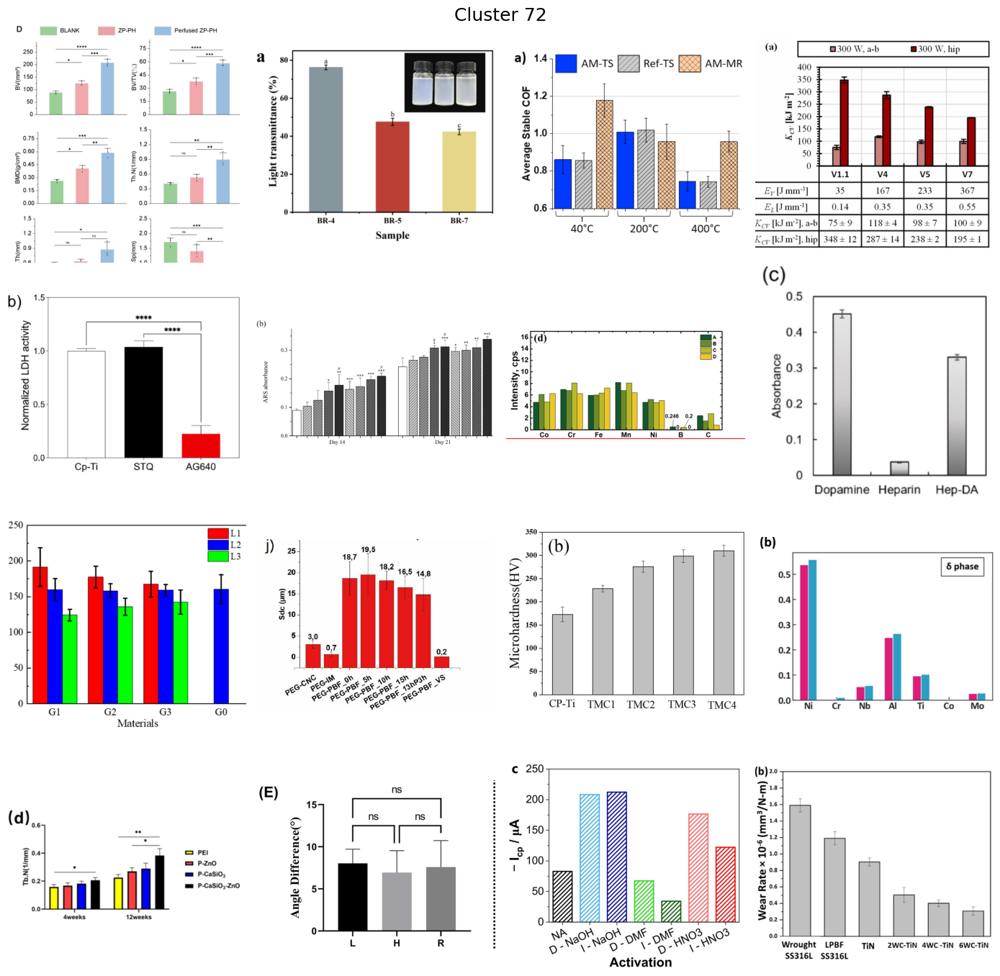

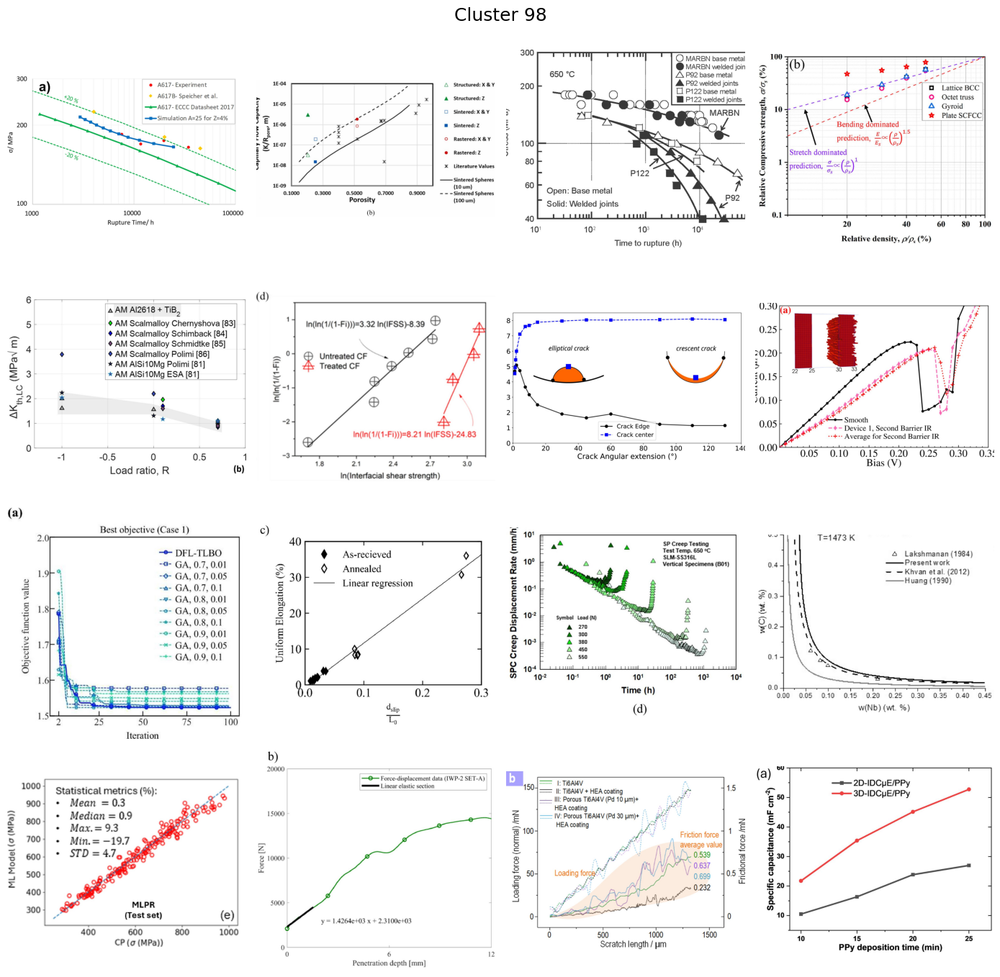

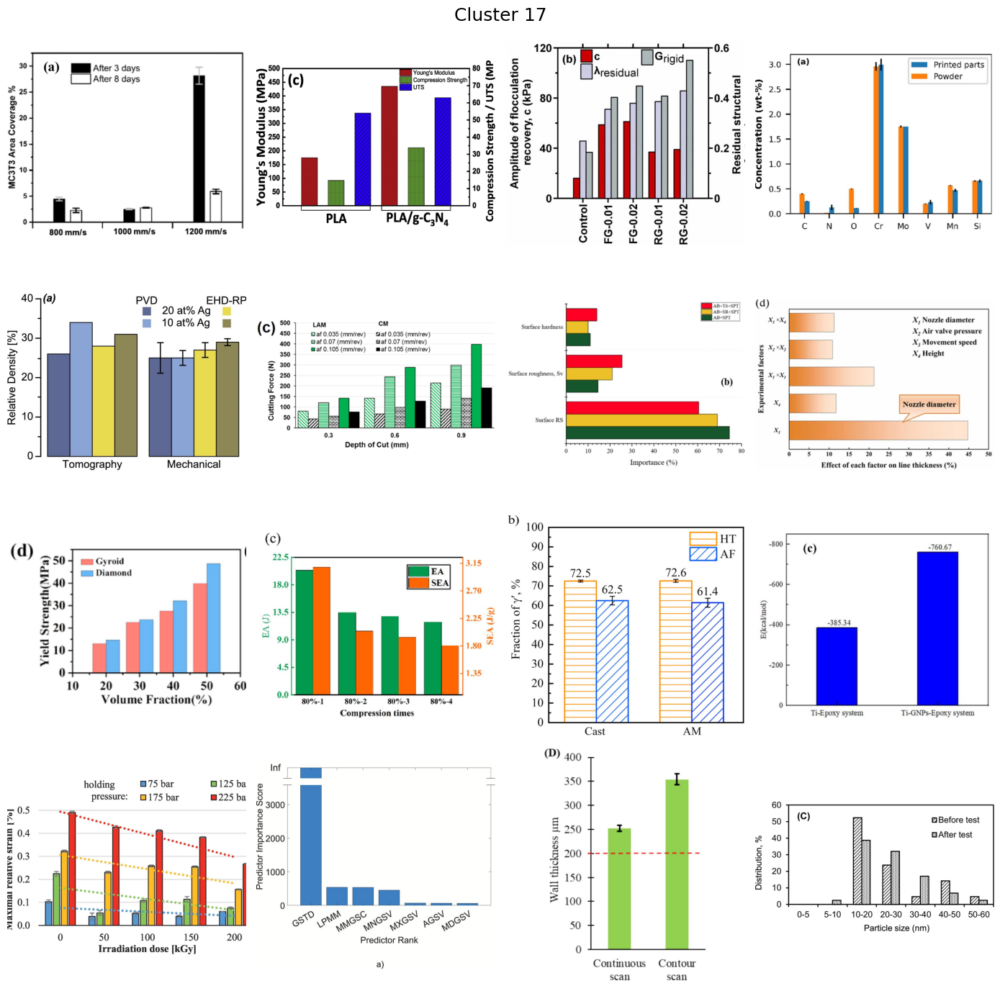

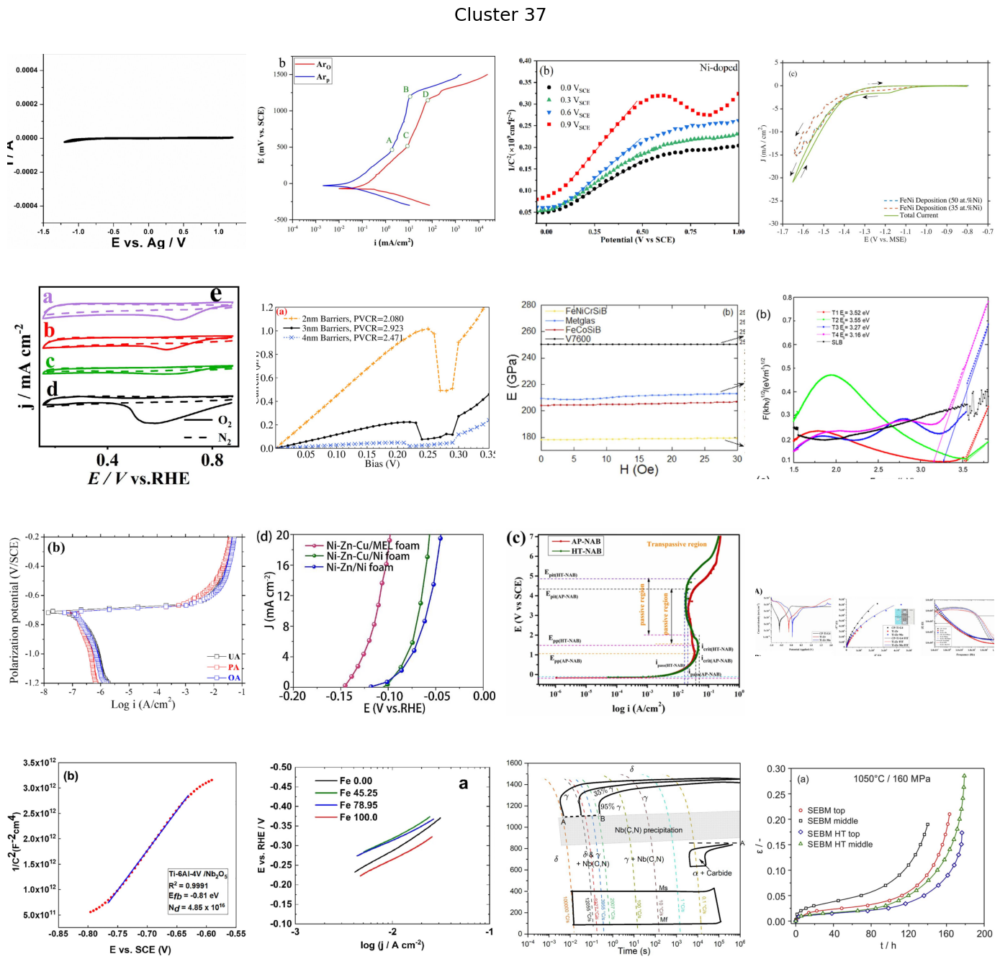

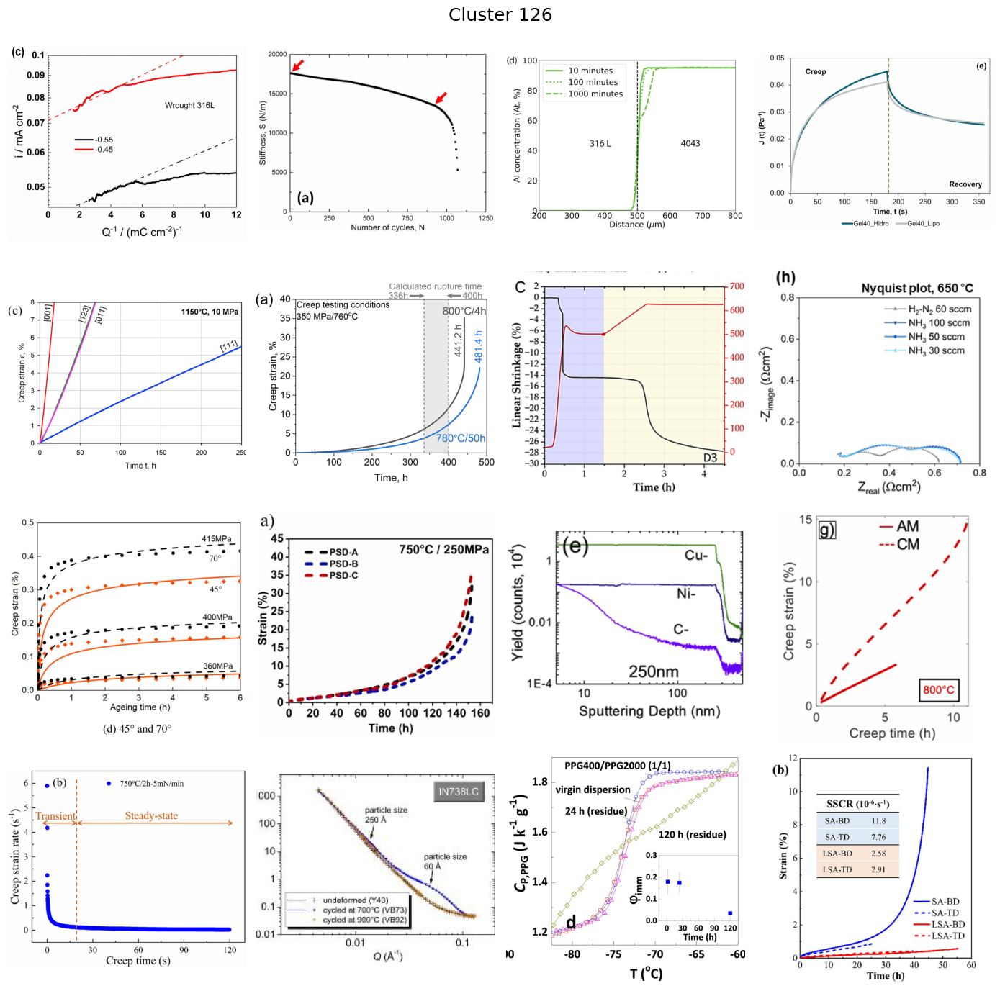

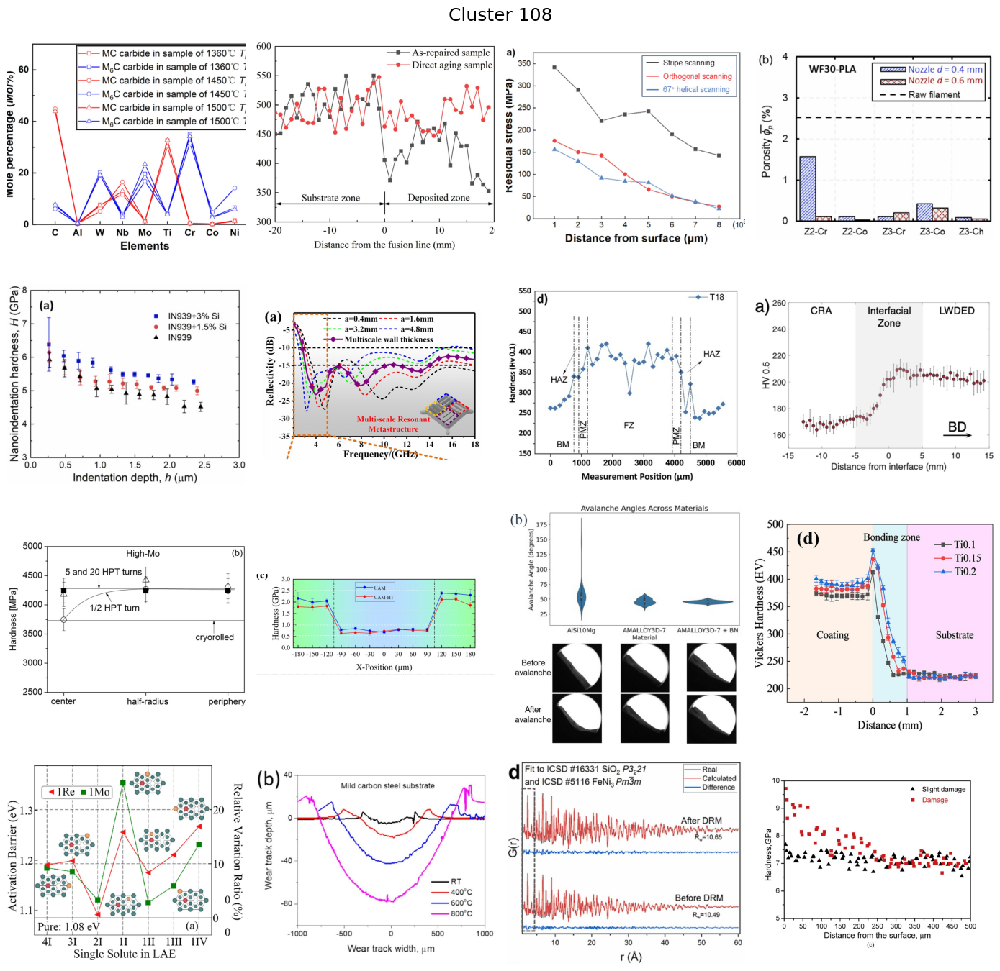

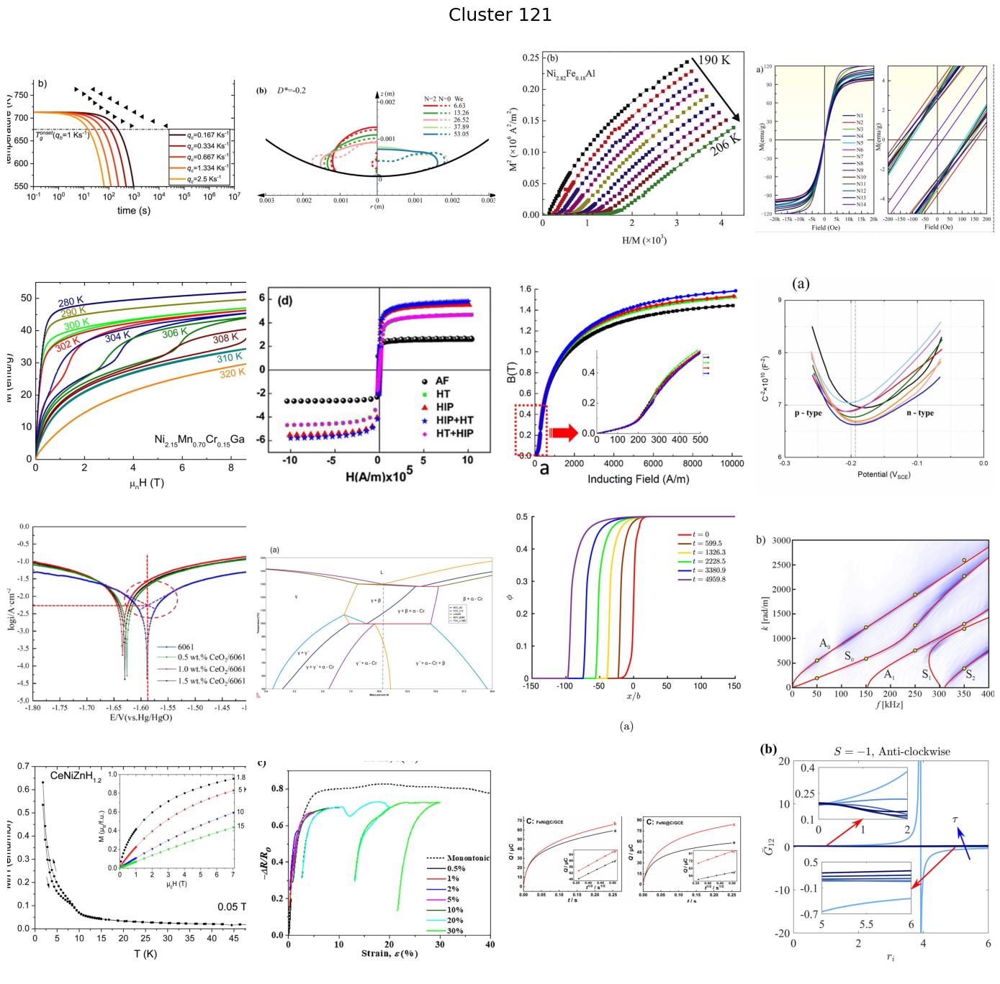

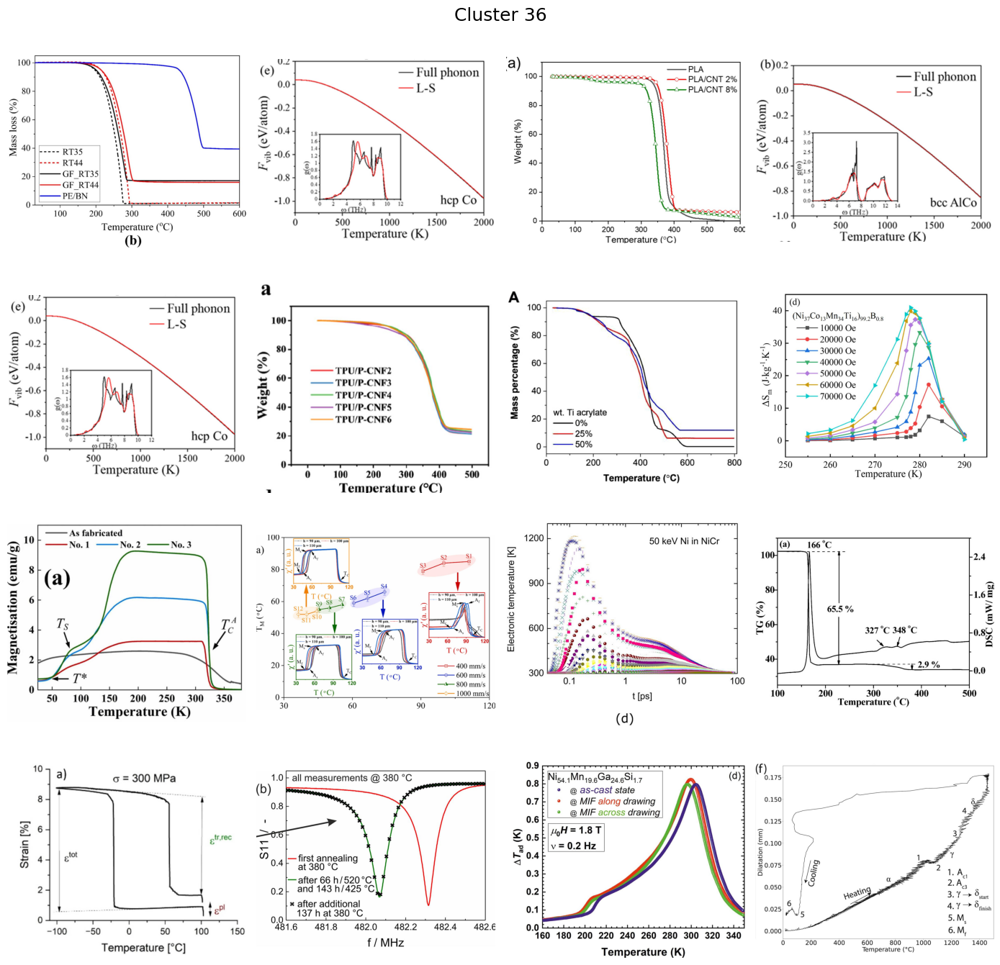

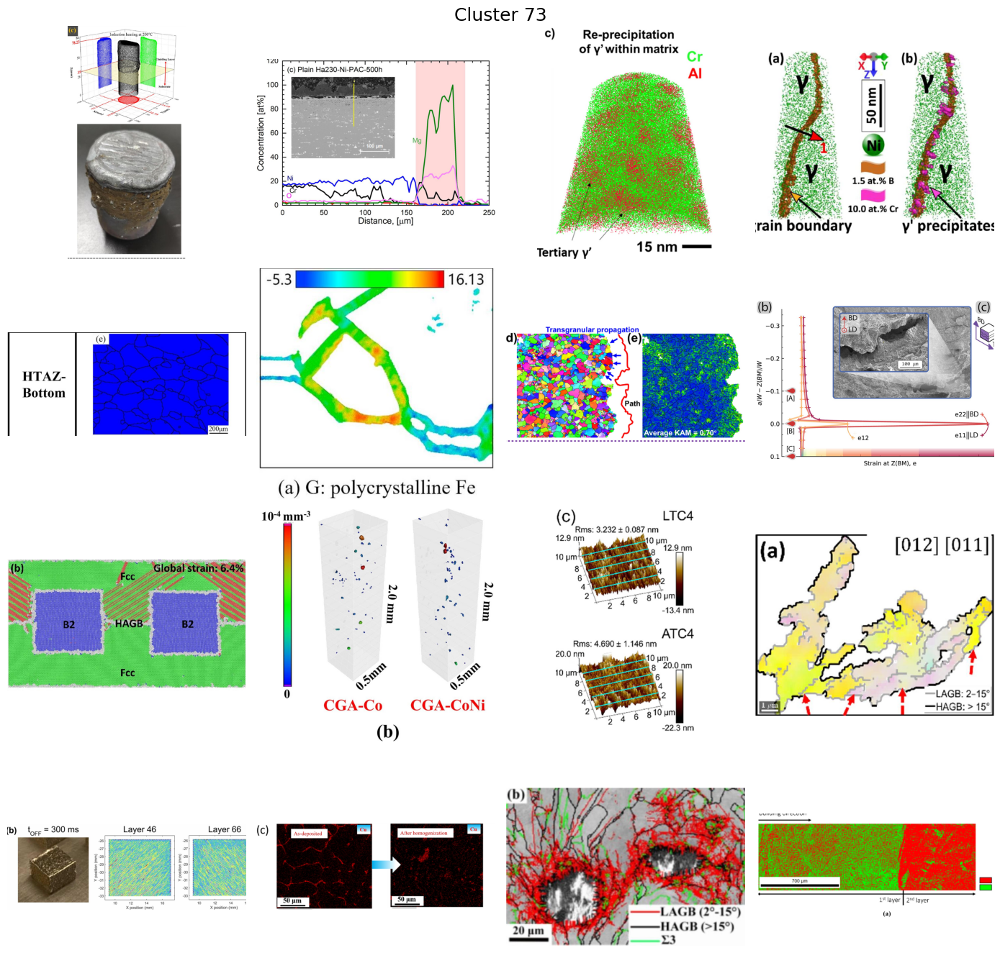

In [35]:
for c in largest_clusters[:10]:
    show_cluster(c)